<a href="https://colab.research.google.com/github/TheRadDani/GANs/blob/main/demo_03_DeepConvolutionalGANsMultichannelImages.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 Importing  libraries

In [1]:
import os
import time
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from tqdm import tqdm
from tensorflow.keras import layers

In [2]:
os.getcwd()

'/content'

Mounting Google drive into Colab so as to use the Image data from the Drive

In [3]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [11]:
!unzip '/content/drive/MyDrive/anime_images_data.zip' -d'/content'

Streaming output truncated to the last 5000 lines.
  inflating: /content/images/62764_2019.jpg  
  inflating: /content/images/62765_2019.jpg  
  inflating: /content/images/62766_2019.jpg  
  inflating: /content/images/62767_2019.jpg  
  inflating: /content/images/62768_2019.jpg  
  inflating: /content/images/62769_2019.jpg  
  inflating: /content/images/6276_2003.jpg  
  inflating: /content/images/62770_2019.jpg  
  inflating: /content/images/62771_2019.jpg  
  inflating: /content/images/62772_2019.jpg  
  inflating: /content/images/62773_2019.jpg  
  inflating: /content/images/62774_2019.jpg  
  inflating: /content/images/62775_2019.jpg  
  inflating: /content/images/62776_2019.jpg  
  inflating: /content/images/62777_2019.jpg  
  inflating: /content/images/62778_2019.jpg  
  inflating: /content/images/62779_2019.jpg  
  inflating: /content/images/6277_2003.jpg  
  inflating: /content/images/62780_2019.jpg  
  inflating: /content/images/62781_2019.jpg  
  inflating: /content/images/62

In [12]:
!ls /content

 animes_images.zip   drive   images   sample_data  'view?usp=drive_link'


In [14]:
batch_size = 128

train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/images', label_mode = None,
    image_size = (64, 64), batch_size = batch_size
)

train_dataset = train_dataset.map(lambda x: (x / 127.5) - 1)

Found 63565 files belonging to 1 classes.


Visualising a batch of real image data

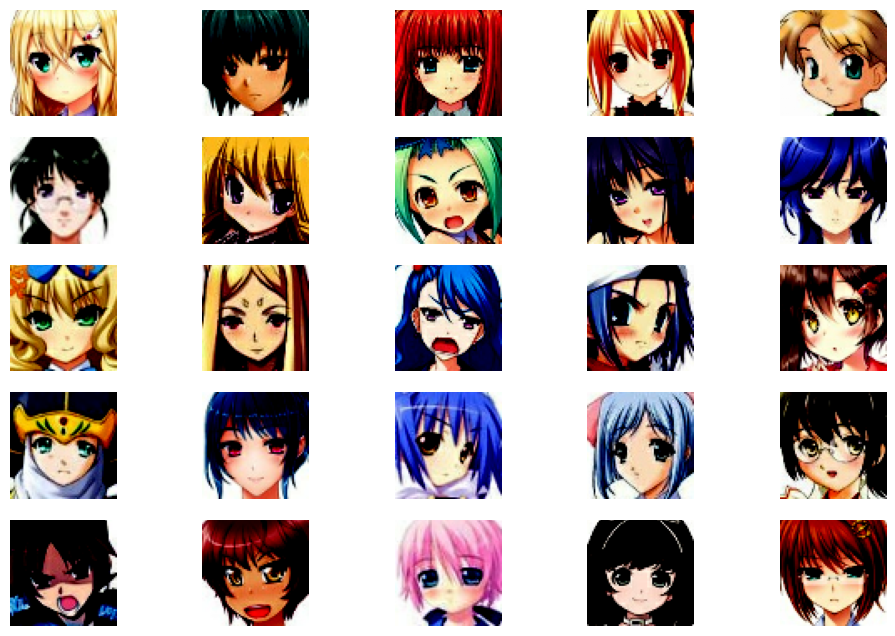

In [17]:
plt.figure(figsize = (12, 8))

for images in train_dataset.take(1):
    for i in range(25):
        ax = plt.subplot(5, 5, i + 1)
        plt.imshow(images[i].numpy())
        plt.axis('off')

Retrieving and plotting  a sample image from batch data and checking its shape. Note that as images are colored, third dimension(channel) is 3

Image_shape (64, 64, 3)


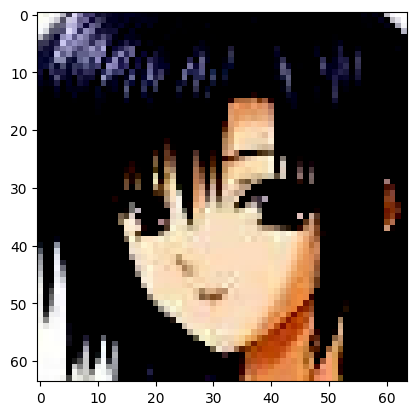

In [18]:
for batch in train_dataset:
    plt.imshow(batch[0])
    print('Image_shape', batch[0].shape)
    break

Both the generator and discriminator are defined using the Keras Sequential API.

The generator uses tf.keras.layers.Conv2DTranspose (upsampling) layers to produce an image from a seed (random noise). Start with a Dense layer that takes this seed as input, then upsample several times until you reach the desired image size of 64X64x3. Notice the tf.keras.layers.ReLU activation for each layer, except the output layer which uses tanh.
All the convolution-layer weights are initialized from a zero-centered normal distribution, with a standard deviation of 0.02 as per the original paper.
Blocks 2, 3, and 4 consist of a convolution layer, followed by a batch-normalization layer and an activation function, ReLU.
The last block comprises no batch-normalization layer, with a sigmoid activation function.

Note that activation in final layer is tanh which outputs in the range -1 to 1. we reshape the 4*4*256-d tensor to (Batch Size, 4, 4, 256) using layers.Reshape function.Code for GAN architecture is based on this link https://www.kaggle.com/mrigendraagrawal/introduction-to-ganime/notebook and the original paper link on  which architecture is based is here-https://arxiv.org/pdf/1511.06434.pdf

In [20]:
init_weights_kernel = tf.keras.initializers.RandomNormal(mean = 0.0, stddev = 0.02) #help withh model convergence during trainnig

In [21]:
def generator_model():
    model = tf.keras.Sequential()

    model.add(layers.Input(shape = (100, )))
    model.add(layers.Dense(4 * 4 * 256))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    model.add(layers.Reshape((4, 4, 256)))

    model.add(layers.Conv2DTranspose(128, kernel_size = 4, padding = 'same', strides = 2,
                                     kernel_initializer = init_weights_kernel , use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    model.add(layers.Conv2DTranspose(64, kernel_size = 4, padding = 'same', strides = 2,
                                     kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    model.add(layers.Conv2DTranspose(32, kernel_size = 4, padding = 'same', strides = 2,
                                     kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    model.add(layers.Conv2DTranspose(3, kernel_size = 4, padding = 'same', strides = 2, activation = 'tanh',
                                     kernel_initializer = init_weights_kernel, use_bias = False))


    return model

Building the generator model and summary is obtained

In [22]:
generator = generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 4096)              413696    
                                                                 
 batch_normalization (BatchN  (None, 4096)             16384     
 ormalization)                                                   
                                                                 
 re_lu (ReLU)                (None, 4096)              0         
                                                                 
 reshape (Reshape)           (None, 4, 4, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 128)        524288    
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 8, 8, 128)        5

/usr/local/lib/python3.10/dist-packages/keras/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


Using the (as yet untrained) generator to create an random colored image.

In [23]:
noise = tf.random.normal([1, 100])

generated_image = generator(noise, training = False)

generated_image.shape

TensorShape([1, 64, 64, 3])

In [25]:
generated_image[0, :5, :5]

<tf.Tensor: shape=(5, 5, 3), dtype=float32, numpy=
array([[[ 8.75145706e-05, -1.06350199e-05, -7.74636792e-05],
        [ 9.77641539e-05, -2.20983376e-04, -2.45747098e-04],
        [ 1.92075968e-04, -2.00078415e-04, -7.11247485e-05],
        [ 2.45006231e-04, -3.37216537e-04, -1.38297459e-04],
        [ 3.84473169e-05, -4.80937597e-05, -2.13314444e-04]],

       [[-1.85814177e-04, -1.69654668e-05,  1.74245419e-04],
        [ 3.76684446e-04,  2.43571762e-04, -4.19855351e-04],
        [ 1.44139311e-04, -6.93943293e-04,  4.09952714e-04],
        [ 9.74800205e-04,  3.68902751e-04, -1.97585527e-04],
        [-1.82038246e-04,  1.72904169e-04,  7.80063274e-04]],

       [[ 1.78815448e-04, -2.07773643e-04, -3.92336078e-05],
        [ 7.66393438e-04, -8.75235128e-04, -1.48832027e-04],
        [ 2.22227063e-05,  3.70036258e-04, -8.01657385e-04],
        [ 2.73637357e-04, -8.93200224e-04, -1.90494058e-04],
        [ 5.56598592e-04, -2.20593749e-04, -2.16508633e-05]],

       [[-2.87252449e-04, -1

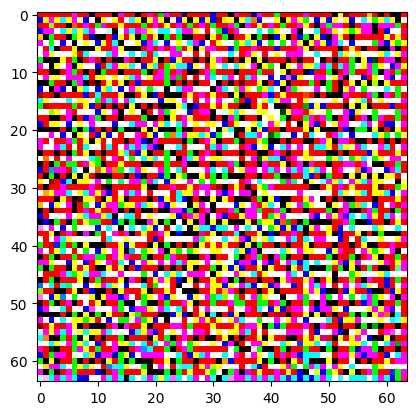

In [26]:
plt.imshow((generated_image[0, :, :, :] * 255 * 100))

The discriminator is a CNN-based image classifier.

Inputs an image of dimension  64 x 64 x 3

Outputs a score between 0 and 1(sigmoid activation in final layer)
Batch normalisation layer is applied for intermediate layers
All the convolution-layer weights are initialized from a zero-centered normal distribution, with a standard deviation of 0.02 as per the original paper.
Has Leaky-Relu (with a slope of 0.2) as an activation function in the intermediate layers along with dropout layers

Has a Sigmoid activation function in the output layer.Note that we can also leave the last layer without sigmoid activation and use_logits=True in Binary Cross entropy function(which is recommended but we have done it this way  for ease in calculating real and fake scores with their display).

https://www.tensorflow.org/api_docs/python/tf/keras/layers/ZeroPadding2D

If tuple of 2 tuples of 2 ints: interpreted as ((top_pad, bottom_pad), (left_pad, right_pad))

In [27]:
def discriminator_model():
    model = tf.keras.Sequential()

    model.add(layers.Conv2D(32, kernel_size = 3, strides = 2, input_shape = (64, 64, 3), padding = 'same',
                            kernel_initializer = init_weights_kernel, use_bias = False ))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(64, kernel_size = 3, strides = 2, padding = 'same',
                            kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.ZeroPadding2D(padding = ((0, 1), (0, 1))))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.25))

    model.add(layers.Conv2D(128, kernel_size = 3, strides = 2, padding = 'same',
                            kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(256, kernel_size = 3, strides=1, padding = 'same',
                            kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation = 'sigmoid'))

    return model

Building the discriminator model and summary is obtained

In [28]:
discriminator = discriminator_model()

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 32)        864       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 32)        0         
                                                                 
 dropout (Dropout)           (None, 32, 32, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 64)        18432     
                                                                 
 zero_padding2d (ZeroPadding  (None, 17, 17, 64)       0         
 2D)                                                             
                                                                 
 batch_normalization_4 (Batc  (None, 17, 17, 64)       256       
 hNormalization)                                      

/usr/local/lib/python3.10/dist-packages/keras/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


Here We are using  the (as yet untrained) discriminator to classify the generated images as real or fake. The model will be trained to output values > 0.5  for real images, and values <0.5 for fake images.

In [29]:
output = discriminator(generated_image)
print (output)

tf.Tensor([[0.5000022]], shape=(1, 1), dtype=float32)


Now We are defining loss functions. In this case it is Binary Cross entropy as target is real or fake images

In [30]:
bce = tf.keras.losses.BinaryCrossentropy()

This method quantifies how well the discriminator is able to distinguish real images from fakes. It compares the discriminator's predictions on real images to an array of 1s, and the discriminator's predictions on fake (generated) images to an array of 0s.

In [31]:
def discriminator_loss(real_output, fake_output):
    real_loss = bce(tf.ones_like(real_output), real_output)
    fake_loss = bce(tf.zeros_like(fake_output), fake_output)

    total_loss = real_loss + fake_loss

    return total_loss

The generator's loss quantifies how well it was able to trick the discriminator. Intuitively, if the generator is performing well, the discriminator will classify the fake images as real (or 1). Here, compare the discriminators decisions on the generated images to an array of 1s.

In [32]:
def generator_loss(fake_output):
    gen_loss = bce(tf.ones_like(fake_output), fake_output)

    return gen_loss

The discriminator and the generator optimizers are different since  two networks would be trained separately.Note that parameters are set as per 2016 paper- https://arxiv.org/pdf/1511.06434.pdf

In [33]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1 = 0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1 = 0.5)

Following code demonstrates how to save and restore models, which can be helpful in case a long running training task is interrupted.

In [34]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(generator_optimizer = generator_optimizer,
                                 discriminator_optimizer = discriminator_optimizer,
                                 generator = generator,
                                 discriminator = discriminator)

The training loop begins with generator receiving a random seed as input. That seed is used to produce an image. The discriminator is then used to classify real images (drawn from the training set) and fakes images (produced by the generator). The loss is calculated for each of these models, and the gradients are used to update the generator and discriminator.

We are using `tf.function`
This annotation causes the function to be "compiled".


In [35]:
epochs = 50
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])

Notice `training` is set to False.
This is so all layers run in inference mode (batchnorm).
Function for generating and saving images is defined

In [36]:
def generate_and_plot_images(model, epoch, test_input):

    predictions = model(test_input, training = False)

    fig = plt.figure(figsize = (8, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow((predictions[i, :, :, :] * 0.5 + 0.5))
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

In [37]:
@tf.function
def train_step(images):
    noise = tf.random.normal([batch_size, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training = True)

        real_output = discriminator(images, training = True)
        fake_output = discriminator(generated_images, training = True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return (gen_loss, disc_loss, tf.reduce_mean(real_output), tf.reduce_mean(fake_output))

In [38]:
def train(dataset, epochs):

    gen_loss_list = []
    disc_loss_list = []

    real_score_list = []
    fake_score_list = []

    for epoch in tqdm(range(epochs)):
        start = time.time()
        num_batches = len(dataset)

        print(f'Training started with  epoch {epoch + 1} with {num_batches} batches..')

        total_gen_loss = 0
        total_disc_loss = 0

        for batch in dataset:
            generator_loss, discriminator_loss, real_score, fake_score = train_step(batch)

            total_gen_loss += generator_loss
            total_disc_loss += discriminator_loss

        mean_gen_loss = total_gen_loss / num_batches
        mean_disc_loss = total_disc_loss / num_batches

        print('Losses after epoch %5d: generator %.3f, discriminator %.3f,\
               real_score %.2f%%, fake_score %.2f%%'  %
              (epoch+1, generator_loss, discriminator_loss, real_score * 100, fake_score * 100))

        generate_and_plot_images(generator, epoch + 1, seed)

        gen_loss_list.append(mean_gen_loss)
        disc_loss_list.append(mean_disc_loss)
        real_score_list.append(real_score)
        fake_score_list.append(fake_score)

        if (epoch + 1) % 10 == 0:
              checkpoint.save(file_prefix = checkpoint_prefix)

        print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time() - start))


    return  gen_loss_list, disc_loss_list, real_score_list, fake_score_list

Finally, it’s time to train our  GAN model in Tensorflow. Taking the train_dataset and epochs as the parameters, the  train function calls the train_step function, at every new batch.At the beginning of the training, the generated images looks hazy. As training progresses, the generated images will look more real. The Real and Fake scores seems to be volatile

  0%|          | 0/50 [00:00<?, ?it/s]

Training started with  epoch 1 with 497 batches..
Losses after epoch     1: generator 6.357, discriminator 0.282,               real_score 85.00%, fake_score 0.91%


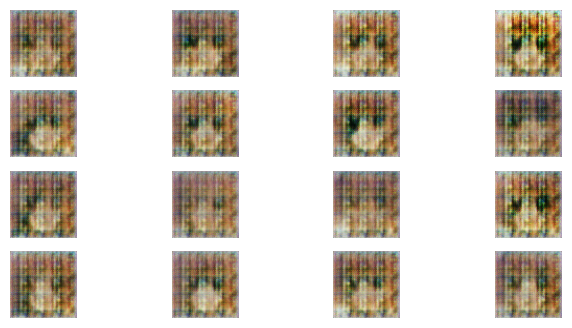

  2%|▏         | 1/50 [00:36<30:02, 36.79s/it]

Time for epoch 1 is 36.78976249694824 sec
Training started with  epoch 2 with 497 batches..
Losses after epoch     2: generator 4.446, discriminator 0.252,               real_score 89.30%, fake_score 7.18%


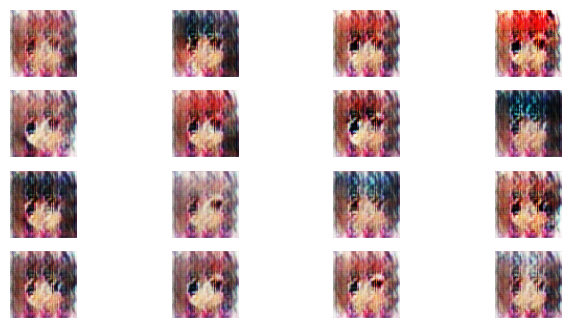

  4%|▍         | 2/50 [01:03<24:54, 31.13s/it]

Time for epoch 2 is 27.15471601486206 sec
Training started with  epoch 3 with 497 batches..
Losses after epoch     3: generator 1.814, discriminator 0.622,               real_score 94.41%, fake_score 30.89%


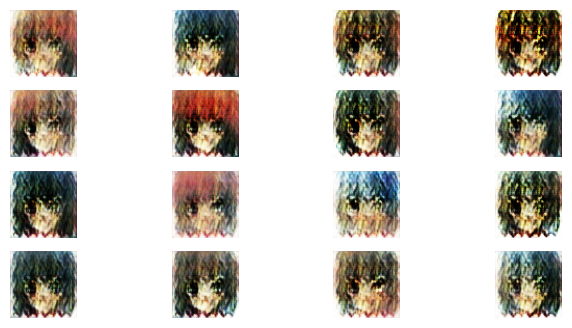

  6%|▌         | 3/50 [01:31<23:09, 29.56s/it]

Time for epoch 3 is 27.686072826385498 sec
Training started with  epoch 4 with 497 batches..
Losses after epoch     4: generator 3.072, discriminator 0.308,               real_score 91.28%, fake_score 12.92%


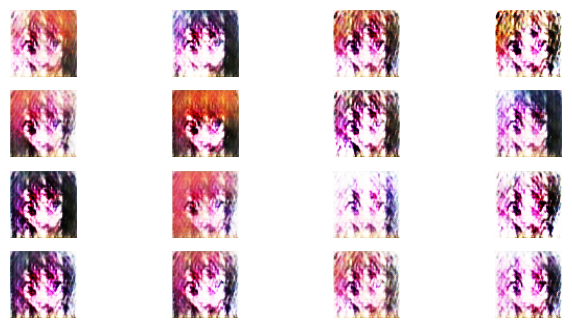

  8%|▊         | 4/50 [01:59<22:04, 28.79s/it]

Time for epoch 4 is 27.618738651275635 sec
Training started with  epoch 5 with 497 batches..
Losses after epoch     5: generator 1.748, discriminator 0.669,               real_score 93.21%, fake_score 31.79%


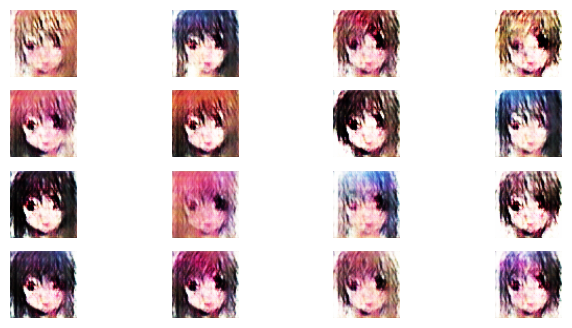

 10%|█         | 5/50 [02:27<21:18, 28.41s/it]

Time for epoch 5 is 27.730356693267822 sec
Training started with  epoch 6 with 497 batches..
Losses after epoch     6: generator 2.850, discriminator 0.263,               real_score 94.70%, fake_score 14.53%


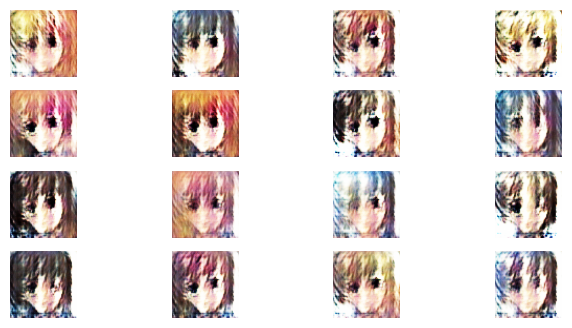

 12%|█▏        | 6/50 [02:54<20:38, 28.15s/it]

Time for epoch 6 is 27.636749744415283 sec
Training started with  epoch 7 with 497 batches..
Losses after epoch     7: generator 9.214, discriminator 0.733,               real_score 62.14%, fake_score 0.05%


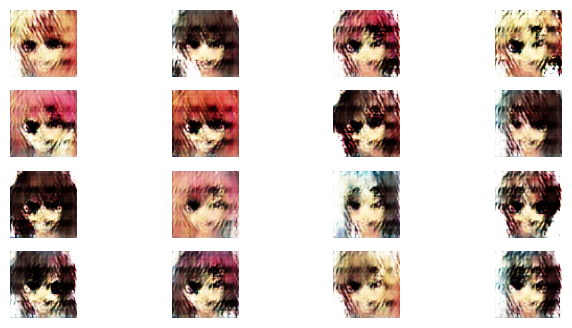

 14%|█▍        | 7/50 [03:22<20:02, 27.96s/it]

Time for epoch 7 is 27.559905290603638 sec
Training started with  epoch 8 with 497 batches..
Losses after epoch     8: generator 2.293, discriminator 0.401,               real_score 94.54%, fake_score 21.43%


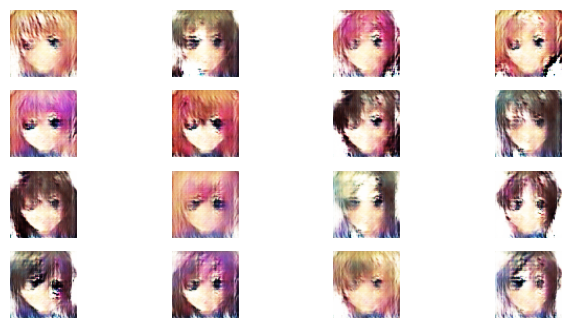

 16%|█▌        | 8/50 [03:50<19:37, 28.03s/it]

Time for epoch 8 is 28.17033863067627 sec
Training started with  epoch 9 with 497 batches..
Losses after epoch     9: generator 2.701, discriminator 0.304,               real_score 95.05%, fake_score 16.84%


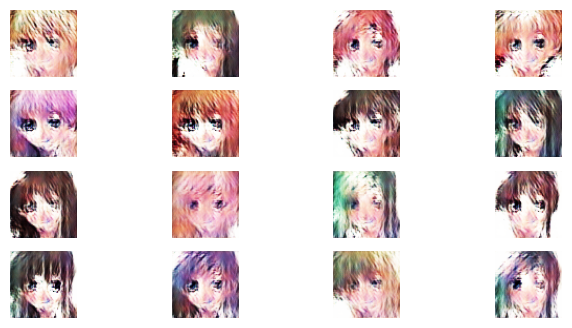

 18%|█▊        | 9/50 [04:18<19:07, 27.99s/it]

Time for epoch 9 is 27.90942072868347 sec
Training started with  epoch 10 with 497 batches..
Losses after epoch    10: generator 3.351, discriminator 0.357,               real_score 82.84%, fake_score 9.41%


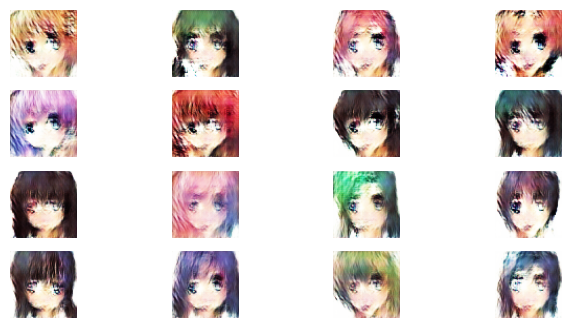

 20%|██        | 10/50 [04:46<18:43, 28.09s/it]

Time for epoch 10 is 28.307557582855225 sec
Training started with  epoch 11 with 497 batches..
Losses after epoch    11: generator 2.873, discriminator 0.435,               real_score 85.77%, fake_score 14.17%


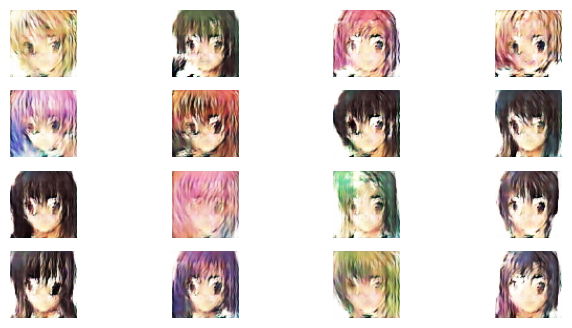

 22%|██▏       | 11/50 [05:14<18:09, 27.94s/it]

Time for epoch 11 is 27.59902548789978 sec
Training started with  epoch 12 with 497 batches..
Losses after epoch    12: generator 2.803, discriminator 0.393,               real_score 89.49%, fake_score 17.24%


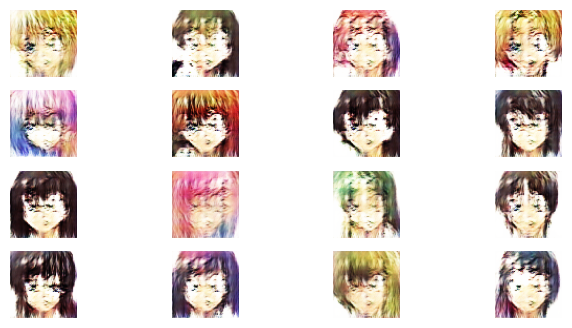

 24%|██▍       | 12/50 [05:41<17:37, 27.83s/it]

Time for epoch 12 is 27.58602213859558 sec
Training started with  epoch 13 with 497 batches..
Losses after epoch    13: generator 2.024, discriminator 0.495,               real_score 94.62%, fake_score 26.53%


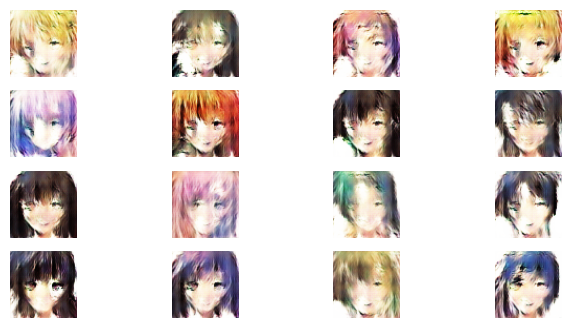

 26%|██▌       | 13/50 [06:09<17:12, 27.90s/it]

Time for epoch 13 is 28.055078506469727 sec
Training started with  epoch 14 with 497 batches..
Losses after epoch    14: generator 2.426, discriminator 0.533,               real_score 86.62%, fake_score 20.17%


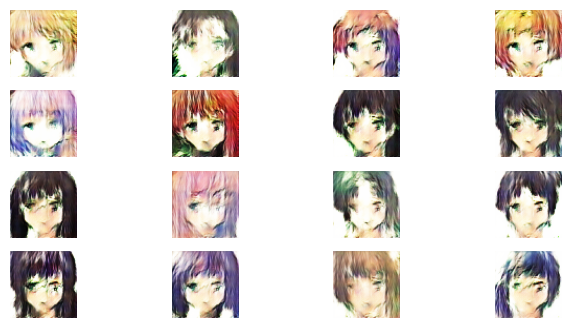

 28%|██▊       | 14/50 [06:37<16:41, 27.81s/it]

Time for epoch 14 is 27.612667322158813 sec
Training started with  epoch 15 with 497 batches..
Losses after epoch    15: generator 1.200, discriminator 0.825,               real_score 98.23%, fake_score 43.59%


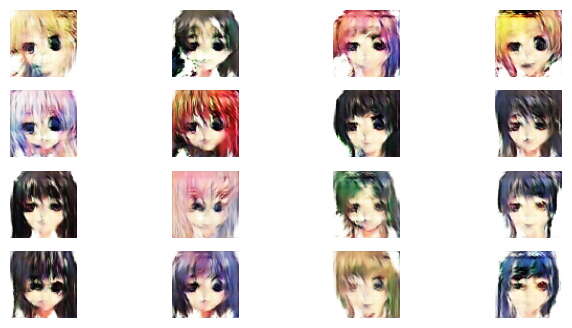

 30%|███       | 15/50 [07:05<16:18, 27.97s/it]

Time for epoch 15 is 28.31872034072876 sec
Training started with  epoch 16 with 497 batches..
Losses after epoch    16: generator 4.064, discriminator 0.445,               real_score 76.06%, fake_score 6.02%


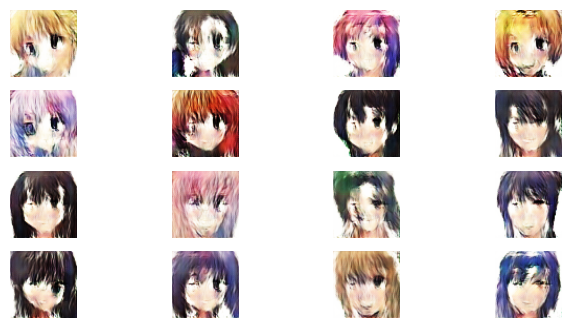

 32%|███▏      | 16/50 [07:33<15:48, 27.91s/it]

Time for epoch 16 is 27.764069080352783 sec
Training started with  epoch 17 with 497 batches..
Losses after epoch    17: generator 4.341, discriminator 0.743,               real_score 61.28%, fake_score 3.74%


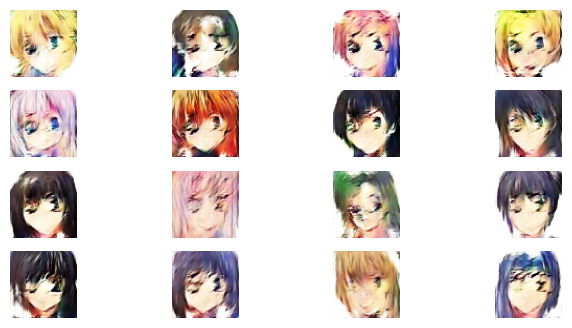

 34%|███▍      | 17/50 [08:01<15:24, 28.00s/it]

Time for epoch 17 is 28.224223375320435 sec
Training started with  epoch 18 with 497 batches..
Losses after epoch    18: generator 4.041, discriminator 0.441,               real_score 75.48%, fake_score 6.45%


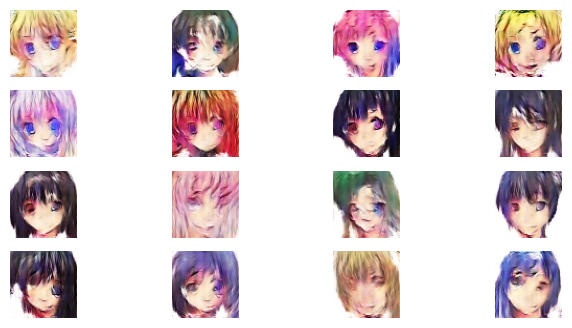

 36%|███▌      | 18/50 [08:29<14:55, 28.00s/it]

Time for epoch 18 is 27.985958099365234 sec
Training started with  epoch 19 with 497 batches..
Losses after epoch    19: generator 5.473, discriminator 0.945,               real_score 54.49%, fake_score 1.56%


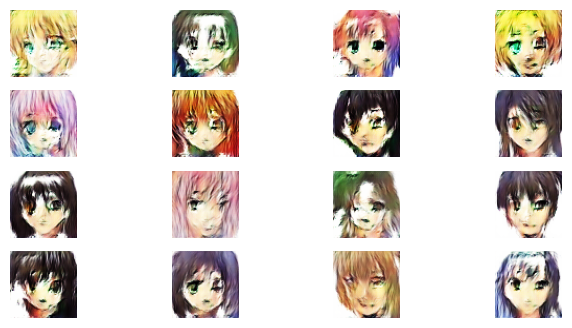

 38%|███▊      | 19/50 [08:57<14:28, 28.00s/it]

Time for epoch 19 is 28.015249967575073 sec
Training started with  epoch 20 with 497 batches..
Losses after epoch    20: generator 2.447, discriminator 0.528,               real_score 80.60%, fake_score 17.68%


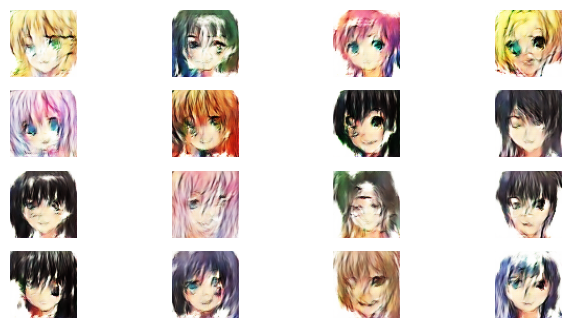

 40%|████      | 20/50 [09:26<14:02, 28.09s/it]

Time for epoch 20 is 28.298163175582886 sec
Training started with  epoch 21 with 497 batches..
Losses after epoch    21: generator 2.464, discriminator 0.452,               real_score 84.64%, fake_score 18.19%


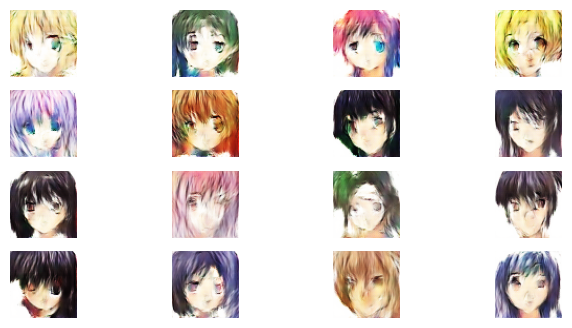

 42%|████▏     | 21/50 [09:53<13:32, 28.01s/it]

Time for epoch 21 is 27.812148571014404 sec
Training started with  epoch 22 with 497 batches..
Losses after epoch    22: generator 4.578, discriminator 0.680,               real_score 67.36%, fake_score 3.84%


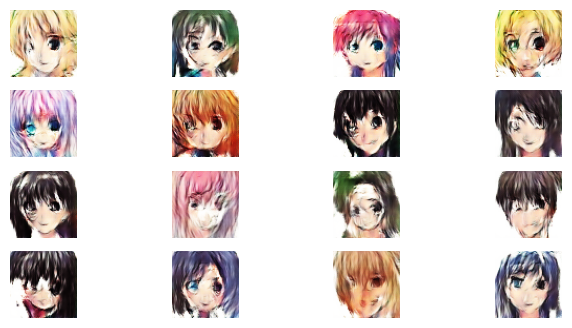

 44%|████▍     | 22/50 [10:22<13:07, 28.12s/it]

Time for epoch 22 is 28.37219762802124 sec
Training started with  epoch 23 with 497 batches..
Losses after epoch    23: generator 2.806, discriminator 0.655,               real_score 69.36%, fake_score 12.96%


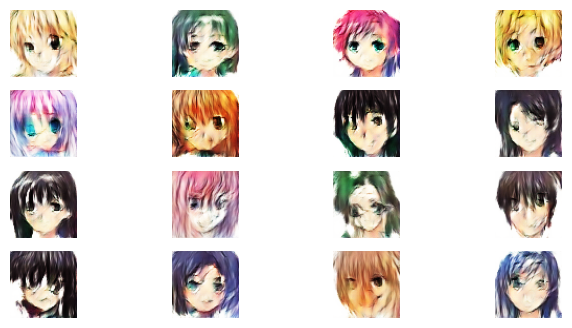

 46%|████▌     | 23/50 [10:50<12:37, 28.04s/it]

Time for epoch 23 is 27.85970139503479 sec
Training started with  epoch 24 with 497 batches..
Losses after epoch    24: generator 5.778, discriminator 2.416,               real_score 20.79%, fake_score 1.75%


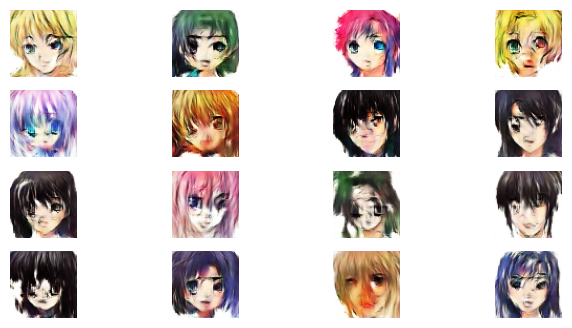

 48%|████▊     | 24/50 [11:18<12:08, 28.01s/it]

Time for epoch 24 is 27.942187786102295 sec
Training started with  epoch 25 with 497 batches..
Losses after epoch    25: generator 2.563, discriminator 0.433,               real_score 86.66%, fake_score 18.69%


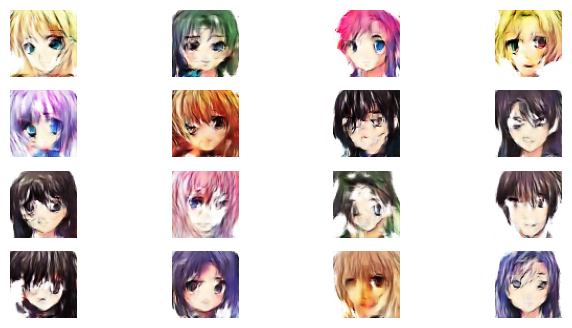

 50%|█████     | 25/50 [11:46<11:42, 28.12s/it]

Time for epoch 25 is 28.357512712478638 sec
Training started with  epoch 26 with 497 batches..
Losses after epoch    26: generator 7.944, discriminator 2.994,               real_score 11.56%, fake_score 0.18%


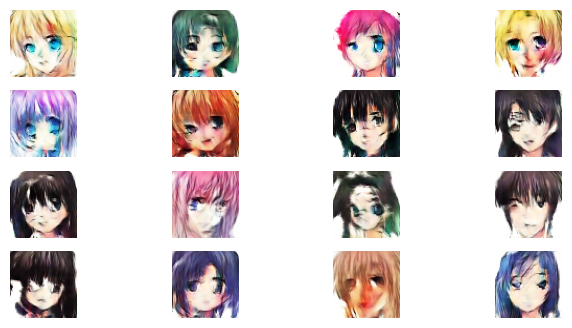

 52%|█████▏    | 26/50 [12:14<11:13, 28.07s/it]

Time for epoch 26 is 27.955661296844482 sec
Training started with  epoch 27 with 497 batches..
Losses after epoch    27: generator 3.025, discriminator 0.386,               real_score 82.66%, fake_score 11.52%


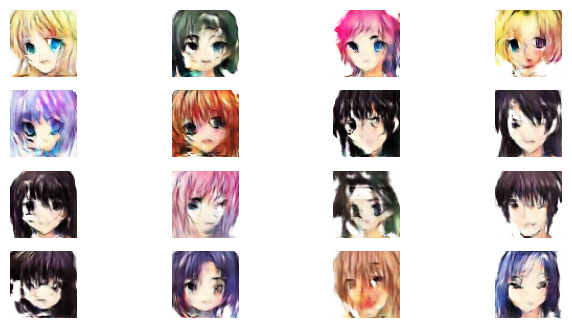

 54%|█████▍    | 27/50 [12:42<10:47, 28.16s/it]

Time for epoch 27 is 28.35231876373291 sec
Training started with  epoch 28 with 497 batches..
Losses after epoch    28: generator 0.709, discriminator 1.338,               real_score 96.57%, fake_score 58.92%


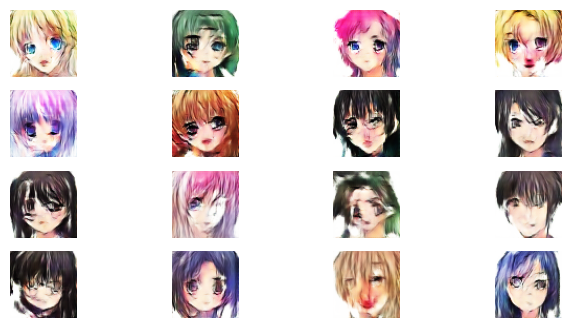

 56%|█████▌    | 28/50 [13:10<10:17, 28.07s/it]

Time for epoch 28 is 27.86197018623352 sec
Training started with  epoch 29 with 497 batches..
Losses after epoch    29: generator 3.418, discriminator 0.399,               real_score 78.85%, fake_score 8.16%


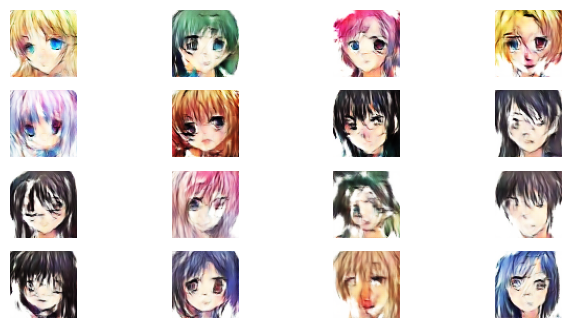

 58%|█████▊    | 29/50 [13:38<09:48, 28.03s/it]

Time for epoch 29 is 27.9407696723938 sec
Training started with  epoch 30 with 497 batches..
Losses after epoch    30: generator 3.103, discriminator 0.379,               real_score 82.69%, fake_score 10.98%


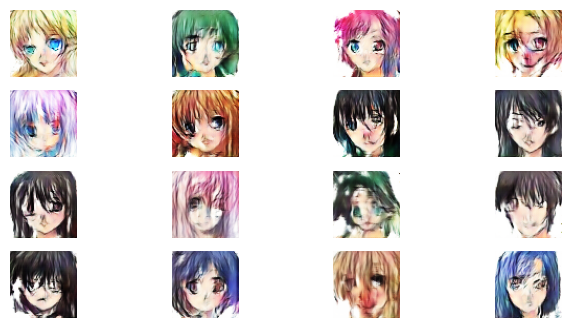

 60%|██████    | 30/50 [14:06<09:22, 28.10s/it]

Time for epoch 30 is 28.269582986831665 sec
Training started with  epoch 31 with 497 batches..
Losses after epoch    31: generator 2.503, discriminator 0.361,               real_score 93.53%, fake_score 19.33%


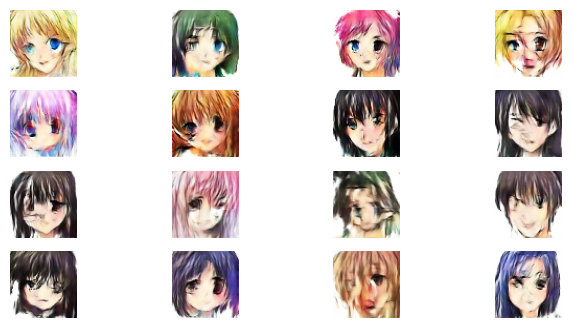

 62%|██████▏   | 31/50 [14:35<08:58, 28.33s/it]

Time for epoch 31 is 28.859869718551636 sec
Training started with  epoch 32 with 497 batches..
Losses after epoch    32: generator 5.078, discriminator 0.834,               real_score 56.54%, fake_score 1.97%


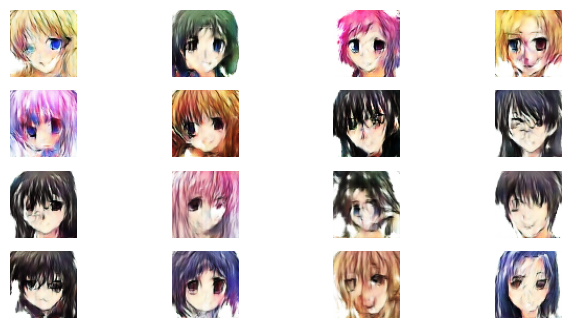

 64%|██████▍   | 32/50 [15:03<08:28, 28.23s/it]

Time for epoch 32 is 27.98880410194397 sec
Training started with  epoch 33 with 497 batches..
Losses after epoch    33: generator 1.911, discriminator 0.447,               real_score 96.22%, fake_score 27.25%


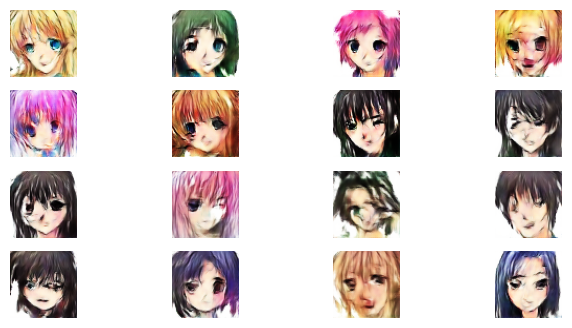

 66%|██████▌   | 33/50 [15:31<07:57, 28.12s/it]

Time for epoch 33 is 27.851768493652344 sec
Training started with  epoch 34 with 497 batches..
Losses after epoch    34: generator 4.907, discriminator 1.007,               real_score 51.35%, fake_score 3.11%


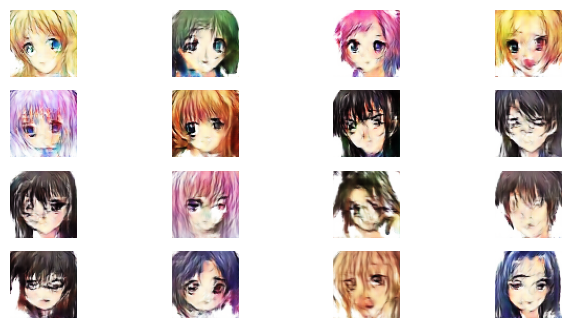

 68%|██████▊   | 34/50 [16:13<08:35, 32.20s/it]

Time for epoch 34 is 41.72379517555237 sec
Training started with  epoch 35 with 497 batches..
Losses after epoch    35: generator 2.836, discriminator 0.284,               real_score 92.65%, fake_score 13.98%


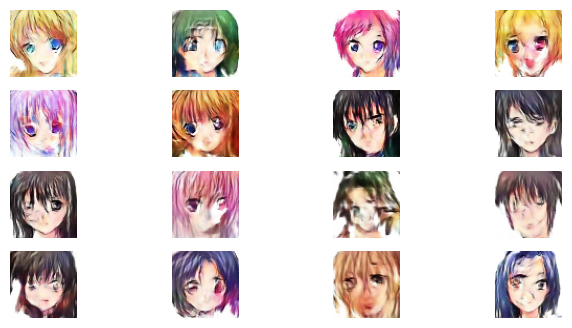

 70%|███████   | 35/50 [16:41<07:47, 31.15s/it]

Time for epoch 35 is 28.689401149749756 sec
Training started with  epoch 36 with 497 batches..
Losses after epoch    36: generator 0.504, discriminator 1.744,               real_score 92.40%, fake_score 68.49%


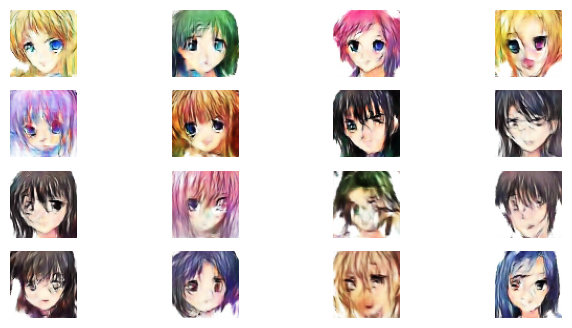

 72%|███████▏  | 36/50 [17:10<07:05, 30.37s/it]

Time for epoch 36 is 28.55102777481079 sec
Training started with  epoch 37 with 497 batches..
Losses after epoch    37: generator 2.150, discriminator 0.310,               real_score 97.81%, fake_score 20.76%


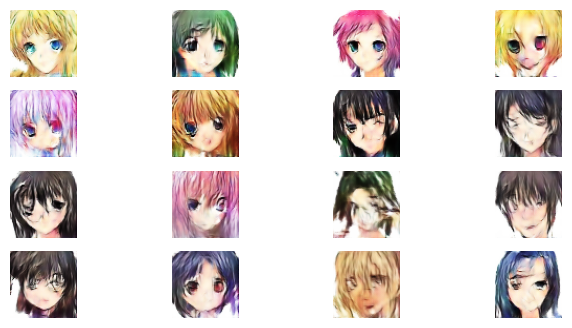

 74%|███████▍  | 37/50 [17:38<06:25, 29.66s/it]

Time for epoch 37 is 28.006356239318848 sec
Training started with  epoch 38 with 497 batches..
Losses after epoch    38: generator 2.172, discriminator 0.324,               real_score 98.53%, fake_score 21.39%


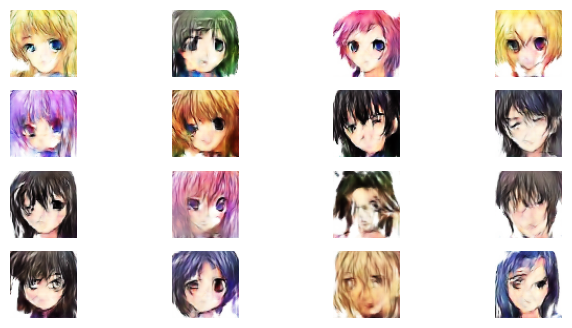

 76%|███████▌  | 38/50 [18:06<05:50, 29.17s/it]

Time for epoch 38 is 28.02357244491577 sec
Training started with  epoch 39 with 497 batches..
Losses after epoch    39: generator 3.588, discriminator 0.411,               real_score 78.52%, fake_score 8.55%


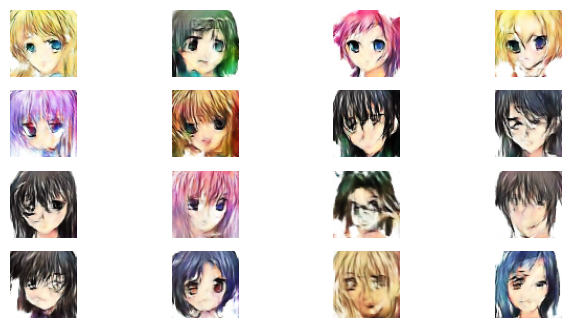

 78%|███████▊  | 39/50 [18:34<05:17, 28.84s/it]

Time for epoch 39 is 28.04798197746277 sec
Training started with  epoch 40 with 497 batches..
Losses after epoch    40: generator 5.178, discriminator 0.406,               real_score 73.86%, fake_score 1.90%


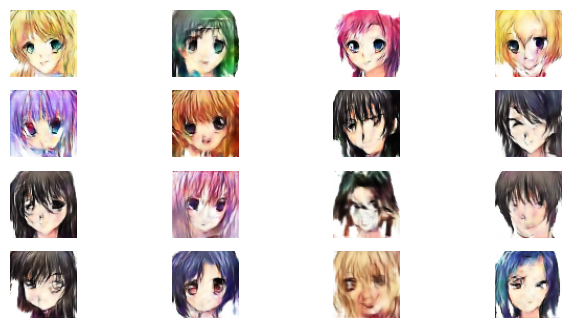

 80%|████████  | 40/50 [19:02<04:46, 28.63s/it]

Time for epoch 40 is 28.158467292785645 sec
Training started with  epoch 41 with 497 batches..
Losses after epoch    41: generator 3.076, discriminator 0.250,               real_score 93.81%, fake_score 13.35%


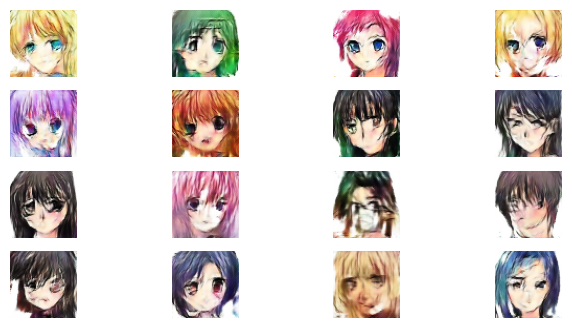

 82%|████████▏ | 41/50 [19:31<04:19, 28.78s/it]

Time for epoch 41 is 29.12128973007202 sec
Training started with  epoch 42 with 497 batches..
Losses after epoch    42: generator 3.611, discriminator 0.196,               real_score 92.27%, fake_score 8.11%


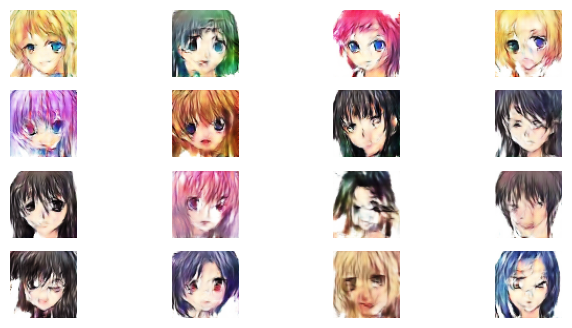

 84%|████████▍ | 42/50 [19:59<03:47, 28.50s/it]

Time for epoch 42 is 27.839853763580322 sec
Training started with  epoch 43 with 497 batches..
Losses after epoch    43: generator 4.178, discriminator 0.503,               real_score 71.42%, fake_score 5.40%


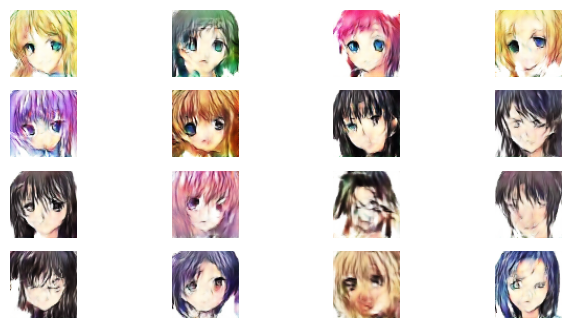

 86%|████████▌ | 43/50 [20:27<03:18, 28.29s/it]

Time for epoch 43 is 27.8063485622406 sec
Training started with  epoch 44 with 497 batches..
Losses after epoch    44: generator 1.660, discriminator 0.772,               real_score 81.17%, fake_score 31.12%


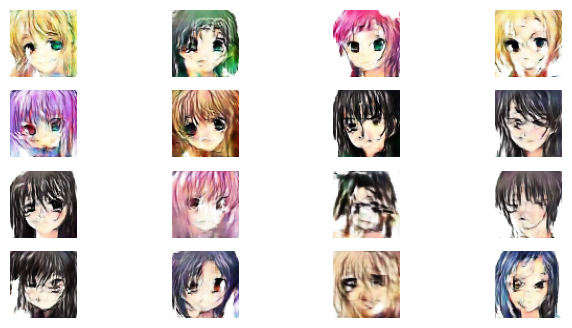

 88%|████████▊ | 44/50 [20:55<02:48, 28.14s/it]

Time for epoch 44 is 27.76661968231201 sec
Training started with  epoch 45 with 497 batches..
Losses after epoch    45: generator 7.346, discriminator 0.466,               real_score 71.61%, fake_score 0.30%


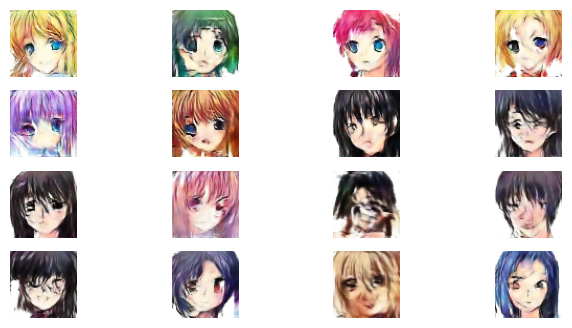

 90%|█████████ | 45/50 [21:36<02:40, 32.15s/it]

Time for epoch 45 is 41.5204918384552 sec
Training started with  epoch 46 with 497 batches..
Losses after epoch    46: generator 4.993, discriminator 0.104,               real_score 93.72%, fake_score 2.77%


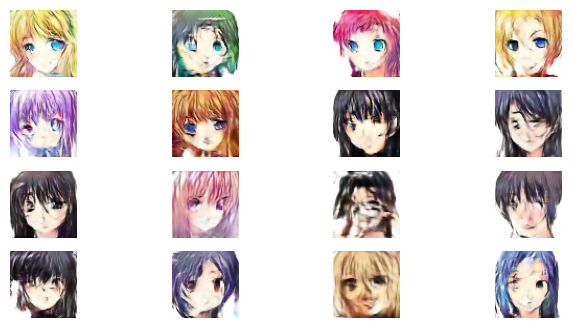

 92%|█████████▏| 46/50 [22:05<02:04, 31.01s/it]

Time for epoch 46 is 28.341604948043823 sec
Training started with  epoch 47 with 497 batches..
Losses after epoch    47: generator 4.361, discriminator 0.068,               real_score 98.37%, fake_score 4.22%


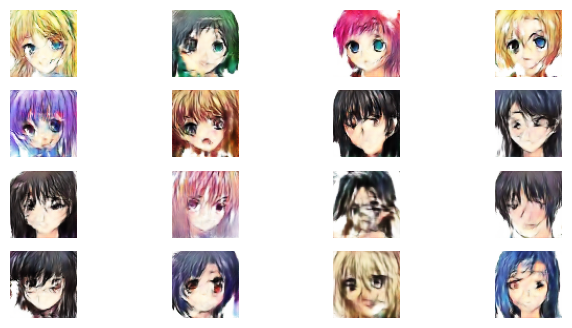

 94%|█████████▍| 47/50 [22:47<01:42, 34.25s/it]

Time for epoch 47 is 41.78430962562561 sec
Training started with  epoch 48 with 497 batches..
Losses after epoch    48: generator 2.516, discriminator 0.603,               real_score 76.95%, fake_score 17.92%


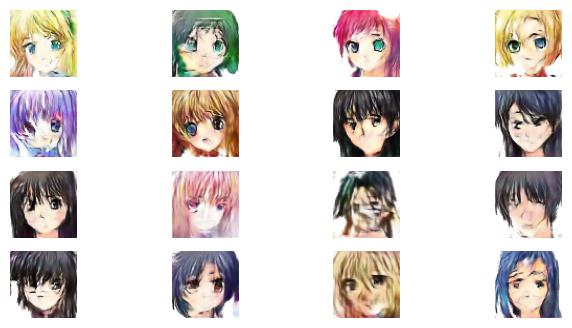

 96%|█████████▌| 48/50 [23:15<01:04, 32.47s/it]

Time for epoch 48 is 28.32112216949463 sec
Training started with  epoch 49 with 497 batches..
Losses after epoch    49: generator 4.628, discriminator 0.376,               real_score 76.98%, fake_score 2.87%


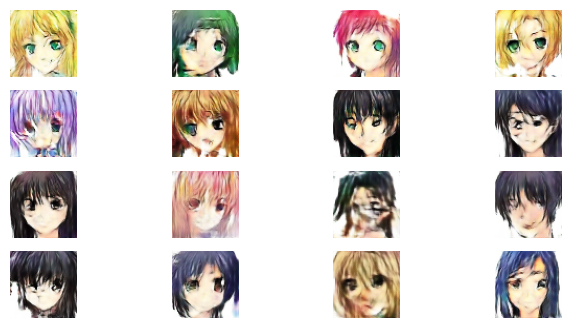

 98%|█████████▊| 49/50 [23:43<00:31, 31.22s/it]

Time for epoch 49 is 28.299594402313232 sec
Training started with  epoch 50 with 497 batches..
Losses after epoch    50: generator 3.371, discriminator 0.133,               real_score 98.00%, fake_score 9.30%


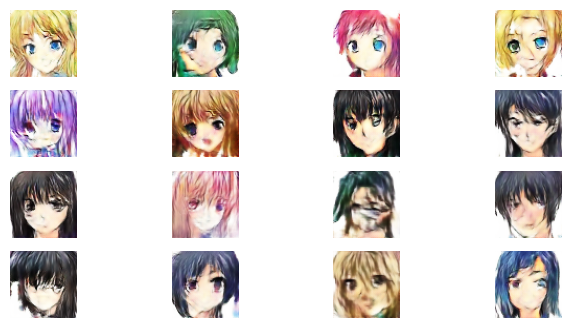

100%|██████████| 50/50 [24:12<00:00, 29.05s/it]

Time for epoch 50 is 28.86733388900757 sec


In [39]:
gen_loss_epochs, disc_loss_epochs, real_score_list, fake_score_list = train(train_dataset, epochs = epochs)

Plotting visualisations for Losses and Scores

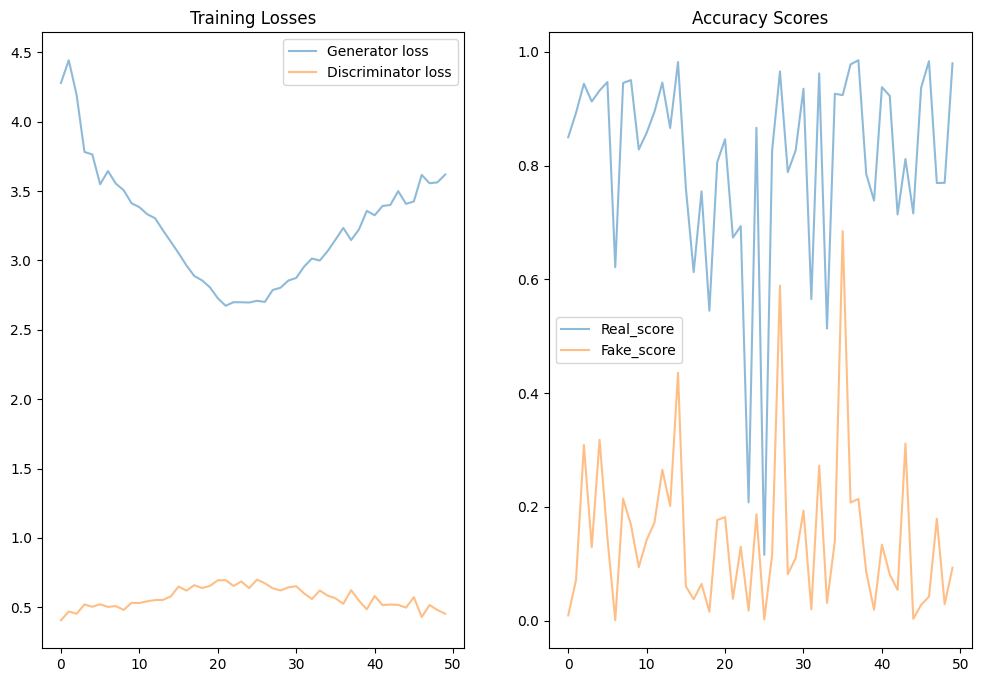

In [40]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize = (12, 8))

ax1.plot(gen_loss_epochs, label = 'Generator loss', alpha = 0.5)
ax1.plot(disc_loss_epochs, label = 'Discriminator loss', alpha = 0.5)
ax1.legend()
ax1.set_title('Training Losses')

ax2.plot(real_score_list, label = 'Real_score', alpha = 0.5)
ax2.plot(fake_score_list, label = 'Fake_score', alpha = 0.5)
ax2.set_title('Accuracy Scores')

ax2.legend()

In [41]:
generated_image = generator(noise, training = False)

(-0.5, 63.5, 63.5, -0.5)

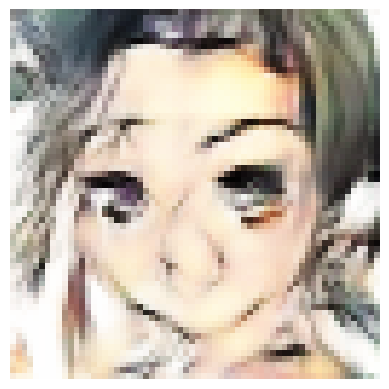

In [45]:
plt.imshow((generated_image[0, :, :, :] * 0.5 + 0.5))
plt.axis(False)